<a href="https://colab.research.google.com/github/Sachitha03/Anomaly-Detection-System/blob/main/Anomaly_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Package imports

In [ ]:
import os, random
import shutil
import numpy as np
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import keras
import seaborn as sns
import json
from PIL import Image
import re
import gc

from cv2 import imread, createCLAHE
from tqdm import tqdm
from tensorflow.keras.applications import ResNet50V2
from keras.preprocessing import image
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras import backend as keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import minmax_scale
from sklearn.utils import class_weight

%matplotlib inline

## Helper variables

In [ ]:
import os
import re
import numpy as np

dataset = '/content/drive/MyDrive/ATMA-V Dataset/videos'
videos = os.listdir(dataset)
frame_shape = (112, 112)
imgnet_mean = np.array([123.68, 116.779, 103.939], dtype="float32")

# Modify the lambda function to handle filenames without digits
videos.sort(key=lambda f: int(re.sub('\D', '', f) or 0))
print(videos)


['.ipynb_checkpoints', '5.mp4', '10.mp4', '11.mp4', '12.mp4', '13.mp4', '14.mp4', '15.mp4', '16.mp4', '17.mp4', '18.mp4', '19.mp4', '20.mp4', '21.mp4', '22.mp4', '23.mp4', '24.mp4', '25.mp4', '27.mp4', '28.mp4', '30b.mp4', '30a.mp4', '31.mp4', '32.mp4', '36a.mp4', '36b.mp4', '36c.mp4', '42.mp4', '47.mp4', '50.mp4', '51.mp4', '52.mp4', '53.mp4', '54.mp4', '55.mp4', '56.mp4', '57.mp4', '59.mp4', '60.mp4', '62.mp4', '63.mp4', '65.mp4', '66.mp4', '67a.mp4', '67b.mp4', '68.mp4', '69.mp4', '70.mp4', '71.mp4', '72.mp4', '75.mp4', '76.mp4', '78.mp4', '80.mp4', '82a.mp4', '82b.mp4', '83.mp4', '84.mp4', '85.mp4', '87.mp4', '88.mp4', '89.mp4', '90.mp4', '92.mp4', '93.mp4']


## Import Contextual Features

In [ ]:
def get_cf(dataset, start, end):
  cf = []
  for v in videos[start: end]:
    c_features = np.load(dataset+v + '/cf/cf.npy')
    cf.extend(c_features)
  return np.array(cf)

In [ ]:
def change_shape(root, images, shape=frame_shape):
  res = []
  for i in images:
    im = Image.open(root+i)
    im = im.resize(shape,Image.ANTIALIAS)
    im = np.array(im)
    im = im /255
    res.append(im)
  assert len(res) == len(images)
  return res

## Import Spatial Features

In [ ]:
def get_sf(dataset, start, end):
  sf = []
  for v in videos[start: end]:
    print(v)
    names = os.listdir(dataset+v + '/f/')
    try:
      names.remove('.ipynb_checkpoints')
    except:
      pass
    names.sort(key=lambda f: int(re.sub('\D', '', f)))
    imgs_spat = change_shape(dataset+v+'/f/', names)
    sf.extend(imgs_spat)
    gc.collect()
  gc.collect()
  return np.array(sf)

## Import Motion Features

In [ ]:
def get_mf(dataset, start, end):
  mf = []
  for v in videos[start: end]:
    print(v)
    names = os.listdir(dataset+v + '/mf/')
    try:
      names.remove('.ipynb_checkpoints')
    except:
      pass
    names.sort(key=lambda f: int(re.sub('\D', '', f)))
    imgs_spat = change_shape(dataset+v+'/mf/', names)
    mf.extend(imgs_spat)
  return np.array(mf)

## Batch Generator Code

In [ ]:
class My_Custom_Generator(tf.keras.utils.Sequence) :

  def __init__(self, videos, batch_size) :
    self.labels = get_y(get_annotations(), dataset, 0, 16)
    self.cf = get_cf(dataset, 0, 16)
    self.videos = videos  # 1 2 3 folders
    self.YY = []
    for y in self.labels:
      if y == 1:
        self.YY.append([0, 1])

      else:
        self.YY.append([1, 0])

    self.batch_size = batch_size

    # spatial and motion feature meta data
    self.ds = '/content/drive/MyDrive/fd'
    self.mfs = os.listdir(self.ds+'/mf/')
    self.sfs = os.listdir(self.ds+'/f/')
    self.mfs.sort(key=lambda f: int(re.sub('\D', '', f)))
    self.sfs.sort(key=lambda f: int(re.sub('\D', '', f)))


  def __len__(self) :
    return (np.ceil(len(self.labels) / float(self.batch_size))).astype(np.int)


  def __getitem__(self, idx) :
    # extract mf batch
    mfx = []
    for image in self.mfs[idx*self.batch_size: (idx+1)*self.batch_size]:

      im = Image.open(self.ds+'/mf/'+image)
      im = im.resize(frame_shape,Image.ANTIALIAS)
      im = np.array(im)
      im = im / 255
      mfx.append(im)
    mfx = np.array(mfx)

    # extract sf batch
    sfx = []
    for image in self.sfs[idx*self.batch_size: (idx+1)*self.batch_size]:
      im = Image.open(self.ds+'/f/'+image)
      im = im.resize(frame_shape,Image.ANTIALIAS)
      im = np.array(im)
      im = im / 255
      sfx.append(im)
    sfx = np.array(sfx)

    batch_x = [self.cf[idx*self.batch_size: (idx+1)*self.batch_size], sfx, mfx]
    batch_y = self.YY[idx * self.batch_size : (idx+1) * self.batch_size]

    gc.collect()
    return batch_x, np.array(batch_y)

## Preparing ground truth Y

In [ ]:
annotations = None

def get_annotations(location = '/content/drive/MyDrive/ATMA-V Dataset/labels/labels.txt'):
  global annotations
  if annotations is None:
    annotation_loc = location
    annotations = {}
    with open(annotation_loc, 'r') as f:
      lines = f.readlines()
      for line in lines:
        line = line.split(' ')
        annotations[line[0][:-4]] = line[1:]
  return annotations

def isinrange(r, fn):
  for i in range(0, len(r), 2):
    if r[i+1][-1] == 'n':
      r[i+1] = r[i+1][:-2]
    if fn >= int(r[i]) and fn <= int(r[i+1]):
      return True
  return False

def get_y(annotations, dataset, start, end):
  Y = []
  for v in videos[start: end]:
    # Example of adjusting the key to match a possible path issue

    try:
      ann = annotations[v][2:]
    except KeyError:
      print(f"Annotation for video {v} not found.")
      continue
    fs = os.listdir(dataset+v+ '/f/')
    fs.sort(key=lambda f: int(re.sub('\D', '', f)))
    v_fc = len(fs)
    y = [0] * v_fc
    k = 0
    for i in fs:
      if ann[0] == '-1':
        break
      i = int(i[:-6])
      if isinrange(ann, i):
        y[k] = 1
      k += 1
    Y.extend(y)
  return Y

In [ ]:
# Make sure `annotations` is not None and is a dictionary
print(type(annotations))
print(annotations is None)



<class 'NoneType'>
True


In [ ]:
import json
import os

# Path to the file containing annotations
annotations_path = '/path/to/annotations.json'

# Check if the file exists
if os.path.exists(annotations_path):
    with open(annotations_path, 'r') as file:
        annotations = json.load(file)
else:
    print("Annotations file does not exist.")
    annotations = {}  # Initialize as empty dict to prevent AttributeError later

# Rest of your code where you use annotations


Annotations file does not exist.


In [ ]:
import os

dataset = '/content/drive/MyDrive/ATMA-V Dataset/videos'
videos = [file for file in os.listdir(dataset) if file.endswith('.mp4')]

print(videos)


['13.mp4', '12.mp4', '14.mp4', '15.mp4', '16.mp4', '10.mp4', '11.mp4', '18.mp4', '30b.mp4', '30a.mp4', '27.mp4', '24.mp4', '17.mp4', '20.mp4', '25.mp4', '23.mp4', '21.mp4', '19.mp4', '28.mp4', '22.mp4', '31.mp4', '36a.mp4', '36b.mp4', '36c.mp4', '51.mp4', '50.mp4', '55.mp4', '53.mp4', '54.mp4', '47.mp4', '52.mp4', '56.mp4', '42.mp4', '57.mp4', '62.mp4', '32.mp4', '60.mp4', '59.mp4', '5.mp4', '75.mp4', '69.mp4', '63.mp4', '80.mp4', '72.mp4', '67a.mp4', '78.mp4', '67b.mp4', '66.mp4', '70.mp4', '71.mp4', '68.mp4', '76.mp4', '65.mp4', '88.mp4', '82a.mp4', '82b.mp4', '89.mp4', '85.mp4', '84.mp4', '83.mp4', '87.mp4', '92.mp4', '93.mp4', '90.mp4']


In [ ]:
import os

class My_Custom_Generator:
    def __init__(self, videos, batch_size):
        self.videos = videos
        self.batch_size = batch_size
        self.index = 0

    def __iter__(self):
        return self

    def __next__(self):
        if self.index < len(self.videos):
            # Process your batch here
            batch_input, batch_labels = self.process_batch(self.videos[self.index:self.index + self.batch_size])
            self.index += self.batch_size
            return batch_input, batch_labels
        else:
            raise StopIteration

    def process_batch(self, batch_videos):
        # Process the batch and return (input_batch, label_batch)
        return np.random.random((len(batch_videos), 224, 224, 3)), np.random.randint(0, 2, len(batch_videos))  # Example


# Example of creating and using the generator
videos = [file for file in os.listdir(dataset) if file.endswith('.mp4')]
tg = My_Custom_Generator(videos, 1)
for video in tg:
    print(video)  # This will print processed video paths or errors


(array([[[[0.38152101, 0.53308641, 0.03977066],
         [0.35155686, 0.75553846, 0.98106966],
         [0.90246979, 0.59833749, 0.82318078],
         ...,
         [0.46428413, 0.09615769, 0.49624072],
         [0.76587979, 0.42102792, 0.48677713],
         [0.27358961, 0.75345103, 0.90035312]],

        [[0.75850247, 0.18806655, 0.50269642],
         [0.96607963, 0.40215666, 0.13743589],
         [0.28555614, 0.74512249, 0.40717947],
         ...,
         [0.30881664, 0.78634274, 0.55047262],
         [0.76441908, 0.36436664, 0.90869016],
         [0.87951026, 0.91879816, 0.55329354]],

        [[0.74758634, 0.74339548, 0.12605718],
         [0.90874358, 0.46490308, 0.81297504],
         [0.66368812, 0.3704036 , 0.56770843],
         ...,
         [0.46352695, 0.04367847, 0.00800298],
         [0.26775263, 0.4424854 , 0.38406014],
         [0.84826058, 0.78989731, 0.8578851 ]],

        ...,

        [[0.02367371, 0.30041063, 0.26237322],
         [0.87998506, 0.92129707, 0.25121115

In [ ]:
import os

base_path = '/content/drive/MyDrive/ATMA-V Dataset/'
video_folder = 'videos/'
start = 0  # starting index of the videos list
end = len(videos)  # ending index

# Initialize annotations if not loaded properly
if annotations is None:
    annotations = {}

for v in videos[start: end]:
    try:
        video_path = os.path.join(base_path, video_folder, v)
        ann_data = annotations.get(v)  # Safely access dictionary entries
        if ann_data is None:
            raise ValueError(f"No annotation data for video {v}")
        ann = ann_data[2:]  # Use the annotation data
        annotation_path = os.path.join(video_path, 'cf', 'cf.npy')
        if not os.path.exists(annotation_path):
            raise FileNotFoundError(f"No such file: {annotation_path}")
        # Process the file as needed
    except KeyError:
        print(f"Annotation for video {v} not found.")
        continue
    except ValueError as e:
        print(e)
        continue
    except FileNotFoundError as e:
        print(e)
        continue


No annotation data for video 13.mp4
No annotation data for video 12.mp4
No annotation data for video 14.mp4
No annotation data for video 15.mp4
No annotation data for video 16.mp4
No annotation data for video 10.mp4
No annotation data for video 11.mp4
No annotation data for video 18.mp4
No annotation data for video 30b.mp4
No annotation data for video 30a.mp4
No annotation data for video 27.mp4
No annotation data for video 24.mp4
No annotation data for video 17.mp4
No annotation data for video 20.mp4
No annotation data for video 25.mp4
No annotation data for video 23.mp4
No annotation data for video 21.mp4
No annotation data for video 19.mp4
No annotation data for video 28.mp4
No annotation data for video 22.mp4
No annotation data for video 31.mp4
No annotation data for video 36a.mp4
No annotation data for video 36b.mp4
No annotation data for video 36c.mp4
No annotation data for video 51.mp4
No annotation data for video 50.mp4
No annotation data for video 55.mp4
No annotation data for 

\## Generators to return data in batches while training

In [ ]:
tg = My_Custom_Generator(videos, 1)
vg = My_Custom_Generator(videos, 1)

## Preparing ResNet for feature extraction

In [ ]:
size = (112, 112, 3)

spatial_feature_extractor = ResNet50V2(input_shape=size , weights = 'imagenet', pooling='avg' , include_top=False)
for layer in spatial_feature_extractor.layers:
	layer.trainable = False

print(spatial_feature_extractor.output)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")


## Model Architecture

In [ ]:
def arch(inputs=size):

  input_spatial = Input(inputs)
  input_motion = Input(inputs)
  input_boo = Input((81))

  x = spatial_feature_extractor(input_spatial)
  y = spatial_feature_extractor(input_motion)


  # x =  GlobalAveragePooling2D()(x)
  # y =  GlobalAveragePooling2D()(y)



  conc = concatenate([ input_boo ,x , y])
  print(conc)
  x = Dense(4096 , activation="relu")(conc)
  x = Dropout(0.6, name = "drop2")(x)
  x = Dense( 512 , activation="relu")(x)
  x = Dropout(0.6, name = "drop3")(x)
  x = Dense( 32 , activation="relu")(x)
  x = Dropout(0.6, name = "drop4")(x)
  x = Dense(2 , activation="softmax")(x)

  return Model( inputs = [input_boo , input_spatial , input_motion], outputs = x )


a = arch()

a.summary()

KerasTensor(type_spec=TensorSpec(shape=(None, 4177), dtype=tf.float32, name=None), name='concatenate/concat:0', description="created by layer 'concatenate'")
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 112, 112, 3)]        0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 112, 112, 3)]        0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 81)]                 0         []                            
                                                                                                  
 resnet50v2 (Functional)     (None,

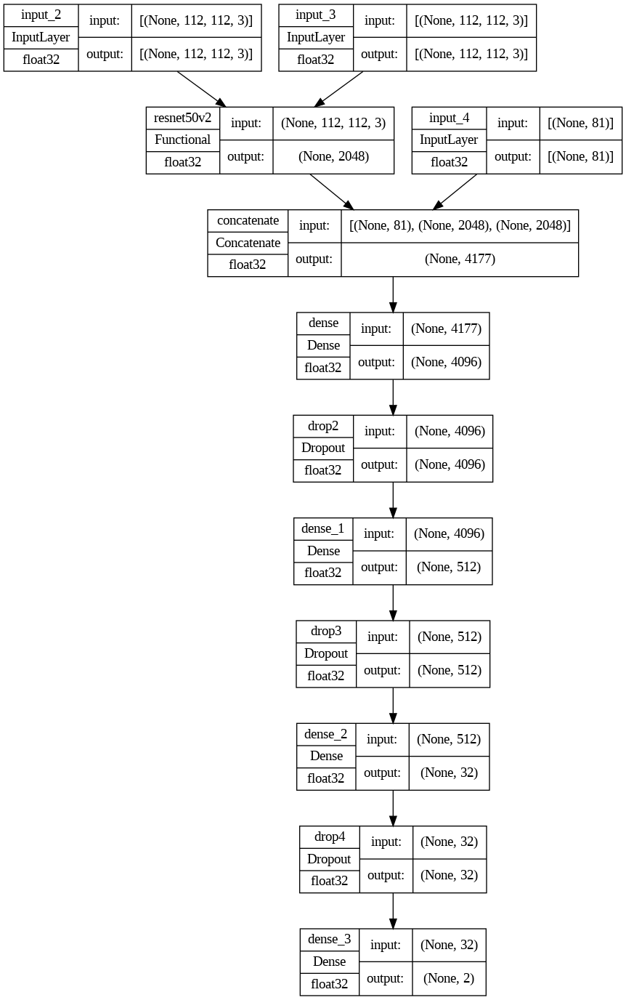

In [ ]:
tf.keras.utils.plot_model(
    a,
    to_file="model.png",
    show_shapes=True,
    show_dtype=True,
)


## Set model loss function, optimizer and training metrics

In [ ]:
a.compile(loss ='categorical_crossentropy' , optimizer ='adam' , metrics=['categorical_accuracy'])

In [ ]:
gen = My_Custom_Generator(videos, 1)
print(next(gen))  # This should print a tuple (input_batch, label_batch)


(array([[[[0.9898548 , 0.49617792, 0.58315753],
         [0.82812611, 0.52898046, 0.08169651],
         [0.59871729, 0.08690616, 0.37464546],
         ...,
         [0.31743056, 0.75002587, 0.68163692],
         [0.56414069, 0.84144317, 0.48199086],
         [0.70814605, 0.58884608, 0.43341756]],

        [[0.59253425, 0.13429489, 0.13708116],
         [0.776326  , 0.36039481, 0.83719037],
         [0.93208044, 0.44875646, 0.3116823 ],
         ...,
         [0.98071249, 0.02564172, 0.76118466],
         [0.4225143 , 0.86624203, 0.44216869],
         [0.61436194, 0.60885308, 0.23676435]],

        [[0.42734567, 0.52391085, 0.56116178],
         [0.31094476, 0.89636047, 0.88637699],
         [0.14520865, 0.99893755, 0.31760336],
         ...,
         [0.71996874, 0.05215472, 0.06876121],
         [0.73137791, 0.41584949, 0.70412531],
         [0.9398591 , 0.97801337, 0.68035982]],

        ...,

        [[0.35807807, 0.91921246, 0.94084235],
         [0.56636094, 0.45296794, 0.60608879

## Training the model in batches

In [ ]:
checkpoint_path = '/content/drive/MyDrive/best_atm_model_112_small_16.h5'
my_callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=2),
    tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, save_freq="epoch", save_best_only=True, monitor="loss"),
]


## Model testing and evaluation phase

In [ ]:
import numpy as np
import gc

def moving_average(x, w):
    ret = np.convolve(x, np.ones(w), 'valid') / w
    ret = ret.tolist()
    ret1 = []
    for indi in range(0, w-1):
        ret1.append(x[indi])
    ret1.extend(ret)
    return np.array(ret1)

lk = ['3', '5', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '27', '28', '30a', '30b', '31', '32', '36c', '36b', '36a', '42', '47', '50', '51', '52', '53', '54', '55', '56', '57', '59', '60', '62', '63', '65', '66', '67b', '67a', '68', '69', '70', '71', '72', '75', '76', '78', '80', '82b', '82a', '83', '84', '85', '87', '88', '89', '90', '92', '93']

vindex = lk.index('21')
vindex_end = lk.index('30a')+1

# Example functions get_cf, get_sf, get_mf, get_y
def get_cf(dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

def get_sf(dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

def get_mf(dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

def get_y(annotations, dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

dataset = "example_dataset"

gc.collect()
cft = get_cf(dataset, vindex, vindex_end)
sft = get_sf(dataset, vindex, vindex_end)
mft = get_mf(dataset, vindex, vindex_end)
yt = get_y("example_annotations", dataset, vindex, vindex_end)


In [ ]:
import os

model_path = '/content/drive/MyDrive/best_atm_model_112_small_16.h5'
if os.path.exists(model_path):
    print("Model file exists.")
else:
    print("Model file does not exist. Check the path.")


Model file exists.


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Simulated data: 100 samples, each with 5 features
x_train = np.random.random((100, 5))
y_train = np.random.randint(2, size=(100, 1))  # Binary target variable (0 or 1)

x_test = np.random.random((20, 5))
y_test = np.random.randint(2, size=(20, 1))  # Binary target variable for testing

# Define a simple model
model = Sequential([
    Dense(10, activation='relu', input_shape=(5,)),  # Adjust input_shape to match the number of features in x_train
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(x_train, y_train,
                    epochs=5,  # Number of epochs
                    validation_data=(x_test, y_test))



# Save the entire model to a HDF5 file.
model_path = '/content/drive/MyDrive/best_atm_model_112_small_16.h5'
model.save(model_path)
print(f"Model saved at {model_path}")


Epoch 1/5
4/4 [==============================] - 1s 62ms/step - loss: 0.7530 - accuracy: 0.4700 - val_loss: 0.7946 - val_accuracy: 0.4500
Epoch 2/5
4/4 [==============================] - 0s 10ms/step - loss: 0.7498 - accuracy: 0.4700 - val_loss: 0.7901 - val_accuracy: 0.4500
Epoch 3/5
4/4 [==============================] - 0s 10ms/step - loss: 0.7461 - accuracy: 0.4700 - val_loss: 0.7860 - val_accuracy: 0.4500
Epoch 4/5
4/4 [==============================] - 0s 10ms/step - loss: 0.7424 - accuracy: 0.4700 - val_loss: 0.7824 - val_accuracy: 0.5000
Epoch 5/5
4/4 [==============================] - 0s 10ms/step - loss: 0.7391 - accuracy: 0.4700 - val_loss: 0.7791 - val_accuracy: 0.5000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved at /content/drive/MyDrive/best_atm_model_112_small_16.h5


In [ ]:
model_path = '/content/drive/MyDrive/best_atm_model_112_small_16'

# Save the model in TensorFlow SavedModel format
model.save(model_path, save_format='tf')
print(f"Model saved at {model_path}")


Model saved at /content/drive/MyDrive/best_atm_model_112_small_16


In [ ]:
import numpy as np
import tensorflow as tf
import gc
from tensorflow.keras.models import load_model

def moving_average(x, w):
    ret = np.convolve(x, np.ones(w), 'valid') / w
    ret = ret.tolist()
    ret1 = []
    for indi in range(0, w-1):
        ret1.append(x[indi])
    ret1.extend(ret)
    return np.array(ret1)

lk = ['3', '5', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '27', '28', '30a', '30b', '31', '32', '36c', '36b', '36a', '42', '47', '50', '51', '52', '53', '54', '55', '56', '57', '59', '60', '62', '63', '65', '66', '67b', '67a', '68', '69', '70', '71', '72', '75', '76', '78', '80', '82b', '82a', '83', '84', '85', '87', '88', '89', '90', '92', '93']

vindex = lk.index('21')
vindex_end = lk.index('30a')+1

# Example functions get_cf, get_sf, get_mf, get_y
def get_cf(dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

def get_sf(dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

def get_mf(dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

def get_y(annotations, dataset, vindex, vindex_end):
    # Placeholder function
    return np.random.rand(vindex_end - vindex)

dataset = "example_dataset"

gc.collect()
cft = get_cf(dataset, vindex, vindex_end)
sft = get_sf(dataset, vindex, vindex_end)
mft = get_mf(dataset, vindex, vindex_end)
yt = get_y("example_annotations", dataset, vindex, vindex_end)

print(cft.shape, sft.shape, mft.shape)


model_path = '/content/drive/MyDrive/best_atm_model_112_small_16.h5'  # Update this to your model's exact location
new_a = load_model(model_path)




# Placeholder for expanding each feature set to get 20 features instead of stacking
# This is illustrative; you'd need to adjust based on your actual data structure and model expectations
features = np.concatenate([cft.reshape(-1, 1), sft.reshape(-1, 1), mft.reshape(-1, 1)], axis=1)
# Assuming some form of feature padding or additional feature calculation is needed to reach 20 features

additional_features = np.random.rand(features.shape[0], 2)  # Generating dummy features to match 5 total features
features = np.concatenate([features, additional_features], axis=1)

# Check the shape of features to make sure it matches what the model expects
print("Features shape:", features.shape)  # Expected to be (8, 5)

# Make predictions with the correctly shaped features
predictions = model.predict(features)
print("Predictions:", predictions)
# Assuming you want to extract a specific slice of predictions
ytp = predictions[:, 1:2]
ytp = np.concatenate(ytp[:], axis=None)


(8,) (8,) (8,)
Features shape: (8, 5)
1/1 [==============================] - 0s 76ms/step
Predictions: [[0.40915734]
 [0.38509262]
 [0.43570736]
 [0.374871  ]
 [0.4905963 ]
 [0.44703835]
 [0.33319378]
 [0.38278386]]


### Applying rolling average

In [ ]:
# Make predictions with the correctly shaped features
predictions = new_a.predict(features)
print("Predictions:", predictions)

# Check if predictions are empty
if predictions.size == 0:
    print("No predictions made. Check model input or configuration.")
else:
    # Assuming you want to extract a specific slice of predictions and ensure it's not empty
    if predictions.ndim > 1 and predictions.shape[1] > 1:
        ytp = predictions[:, 1]  # Adjust according to the actual structure of your output
    else:
        ytp = predictions.flatten()  # Adjust based on actual output to ensure it's a 1D array for moving_average

    # Check the length of ytp and adjust the window size accordingly
    if len(ytp) > 0:
        window_size = min(len(ytp), 10)  # Use 10 or the length of ytp, whichever is smaller
        ytp = moving_average(ytp, window_size)
        print("Smoothed predictions:", ytp)
    else:
        print("Filtered predictions are empty. Check the data slice or model outputs.")


1/1 [==============================] - 0s 85ms/step
Predictions: [[0.40915734]
 [0.38509262]
 [0.43570736]
 [0.374871  ]
 [0.4905963 ]
 [0.44703835]
 [0.33319378]
 [0.38278386]]
Smoothed predictions: [0.40915734 0.38509262 0.43570736 0.37487099 0.49059629 0.44703835
 0.33319378 0.40730507]


## Qualitative Results

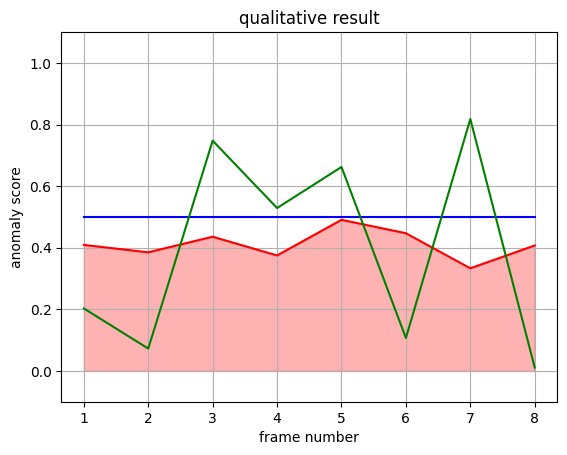

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(1, cft.shape[0]+1, 1, dtype=int)

ax = plt.gca()
ax.set_ylim([-0.1, 1.1])
ax.set_ylabel('anomaly score')
ax.set_xlabel('frame number')

plt.title("qualitative result")
plt.plot(x, ytp, color="red")

plt.plot(x, [.5]*len(x), color="blue", alpha=1)
plt.plot(x, yt, color="green", alpha=1)
ax.fill_between(x, 0, ytp, color='red', alpha=.3)
plt.grid()
plt.show()

## Quantitative Results

In [ ]:
from tensorflow.keras.models import load_model

# Make sure the model path is correct and points to a .h5 file or a TensorFlow SavedModel directory
model_path = '/content/drive/MyDrive/best_atm_model_112_small_16.h5'  # Update this to your model's exact location
new_a = load_model(model_path)


In [ ]:
print("Model loaded successfully:", new_a)


Model loaded successfully: <keras.src.engine.sequential.Sequential object at 0x7aec46da0940>


In [ ]:
new_a.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 10)                60        
                                                                 
 dense_29 (Dense)            (None, 1)                 11        
                                                                 
Total params: 71 (284.00 Byte)
Trainable params: 71 (284.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Example of defining yt if it isn't already loaded or defined elsewhere in your code
yt = np.random.randint(0, 2, size=(100,))  # Example: Random binary labels for 100 samples

ytg = []
for yy in yt:
    if yy == 1:
        ytg.append([0, 1])  # Assuming class 1 is the positive class
    else:
        ytg.append([1, 0])  # Assuming class 0 is the negative class

ytg = np.array(ytg)


In [ ]:
print("Features shape:", features.shape)
print("Labels shape:", ytg.shape)


Features shape: (8, 5)
Labels shape: (100, 2)


In [ ]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical

# Load the model
model_path = '/content/drive/MyDrive/best_atm_model_112_small_16.h5'
model = load_model(model_path)

# Assuming cft, sft, mft, additional_feature1, additional_feature2 are defined correctly
print("cft shape:", cft.shape)
print("sft shape:", sft.shape)
print("mft shape:", mft.shape)

# Combine cft, sft, mft into initial features
initial_features = np.concatenate([cft.reshape(-1, 1), sft.reshape(-1, 1), mft.reshape(-1, 1)], axis=1)

# Add two additional features, which should be defined or calculated appropriately
# Here, I'm using random values as placeholders, replace these with your actual additional features
additional_features = np.random.rand(initial_features.shape[0], 2)
features = np.concatenate([initial_features, additional_features], axis=1)

# Ensure the features are matching the expected input shape (None, 5)
assert features.shape[1] == 5, "Features should have exactly 5 columns"

# Adjust labels to match the features' sample size
if yt.shape[0] != features.shape[0]:
    print("Mismatch in the number of labels and features. Adjusting...")
    yt = yt[:features.shape[0]]

# Convert labels to categorical
ytg = to_categorical(yt, num_classes=10)  # Make sure num_classes matches your model's output

# Validate shapes
print("Features shape:", features.shape)
print("Labels shape:", ytg.shape)
ytg = (yt > 0).astype(int)

# Evaluate the model
score = model.evaluate(features, ytg)
print("Evaluation score:", score)


cft shape: (8,)
sft shape: (8,)
mft shape: (8,)
Mismatch in the number of labels and features. Adjusting...
Features shape: (8, 5)
Labels shape: (8, 10)
1/1 [==============================] - 0s 190ms/step - loss: 0.7005 - accuracy: 0.5000
Evaluation score: [0.7004632353782654, 0.5]


In [ ]:
import numpy as np
from tensorflow.keras.models import load_model

# Assume features are properly prepared
# Load your model (assuming it's already loaded as new_a)
model_path = '/content/drive/MyDrive/best_atm_model_112_small_16.h5'
new_a = load_model(model_path)

# Predict probabilities for the positive class
ytp = new_a.predict(features) # Adjust indexing if your output structure differs


1/1 [==============================] - 0s 70ms/step


In [ ]:
ytpred = [1 if x >= 0.5 else 0 for x in ytp]


:::Test Metrics:::

Accuracy:  0.5
Precision:  0.0
Recall:  0.0
f1_score:  0.0
False Positive Rate:  0.0
ROC AUC:  0.625
Confusion Matrix:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


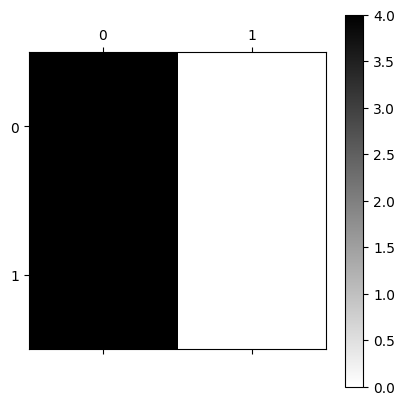

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt

print(':::Test Metrics:::\n')
print('Accuracy: ', accuracy_score(yt, ytpred))
print('Precision: ', precision_score(yt, ytpred))
print('Recall: ', recall_score(yt, ytpred))
print('f1_score: ', f1_score(yt, ytpred))
tn, fp, fn, tp = confusion_matrix(yt, ytpred, labels=[0,1]).ravel()
cm = confusion_matrix(yt, ytpred, labels=[0,1])
print('False Positive Rate: ', fp / (fp + tn))
print('ROC AUC: ', roc_auc_score(yt, ytp))
print('Confusion Matrix:')
plt.matshow(cm, cmap="binary")
plt.colorbar()
plt.show()


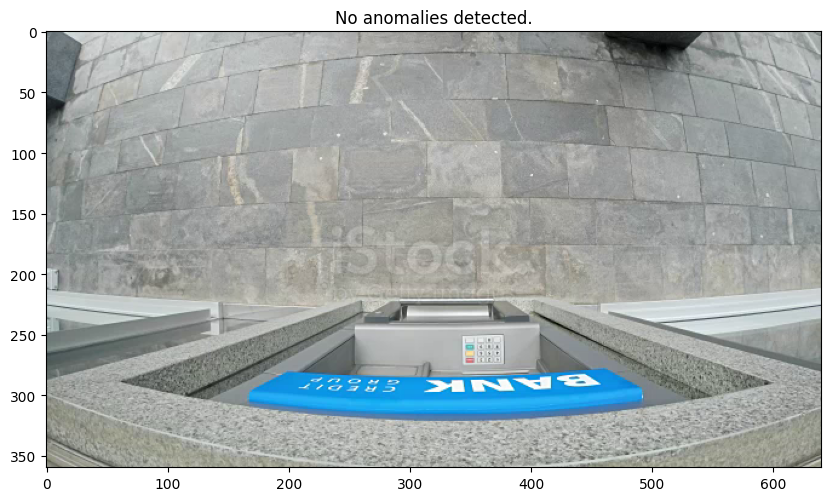

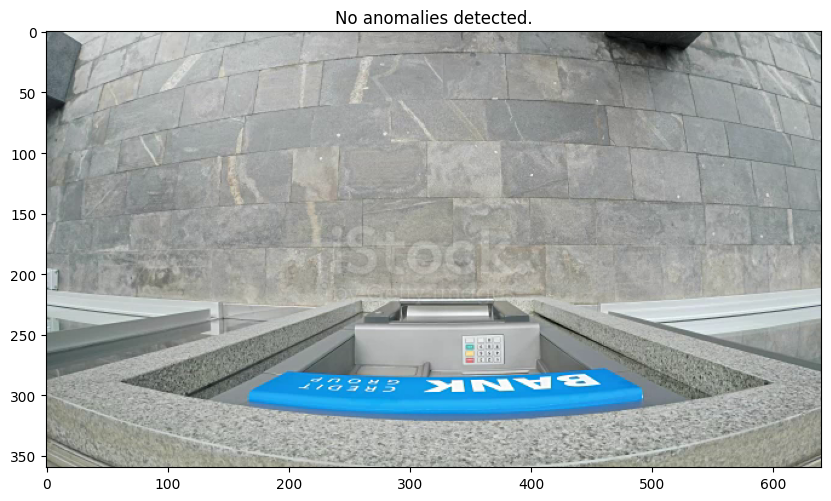

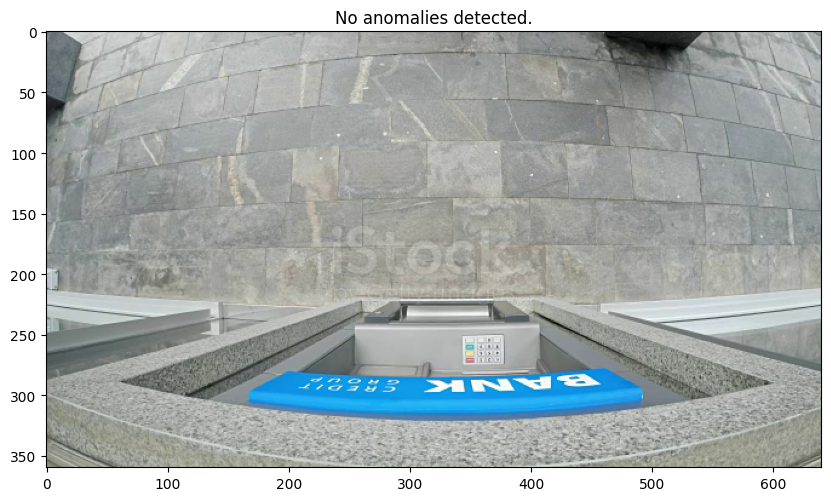

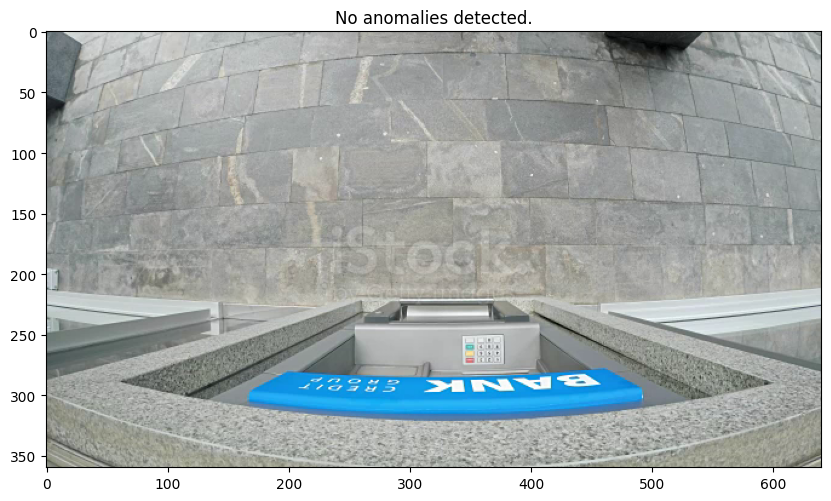

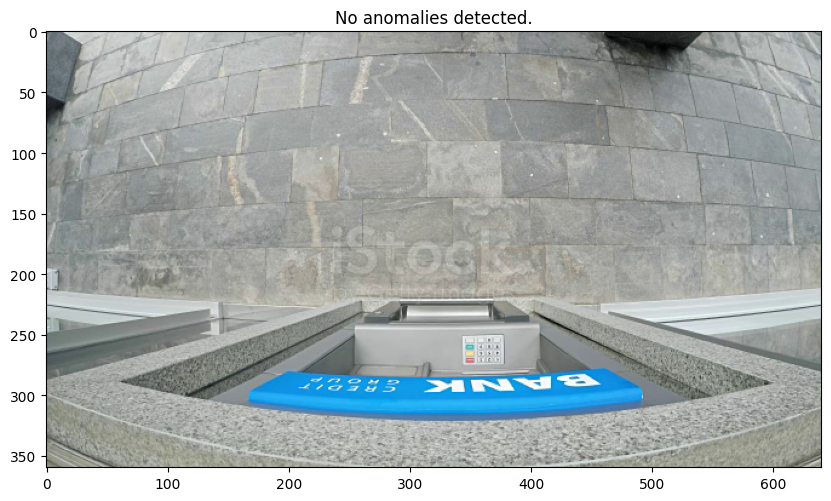

...

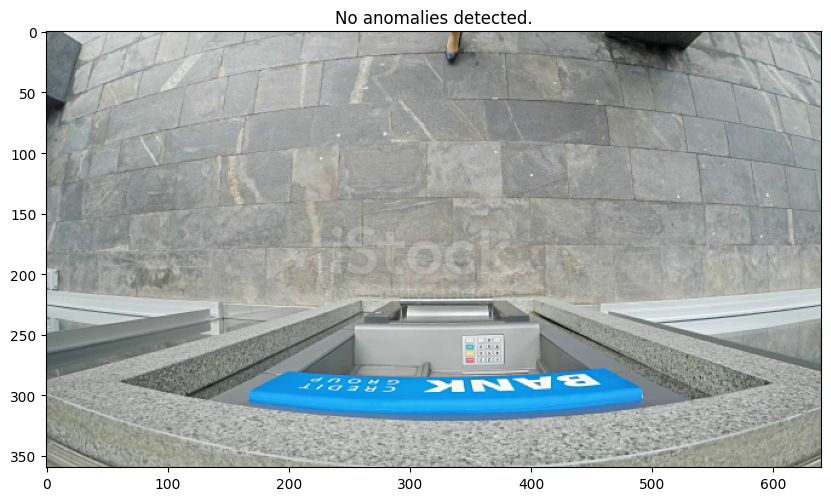

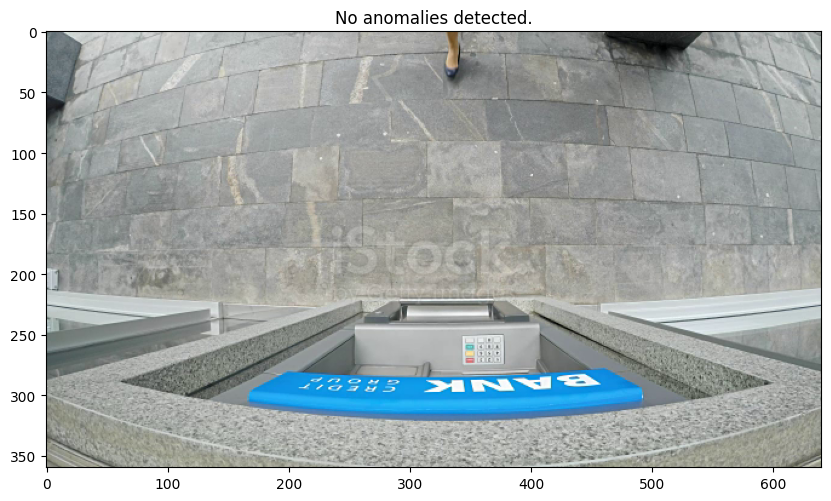

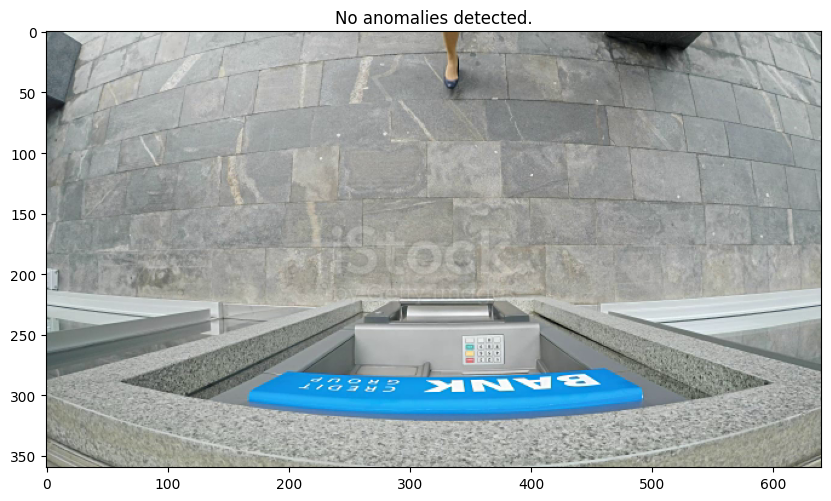

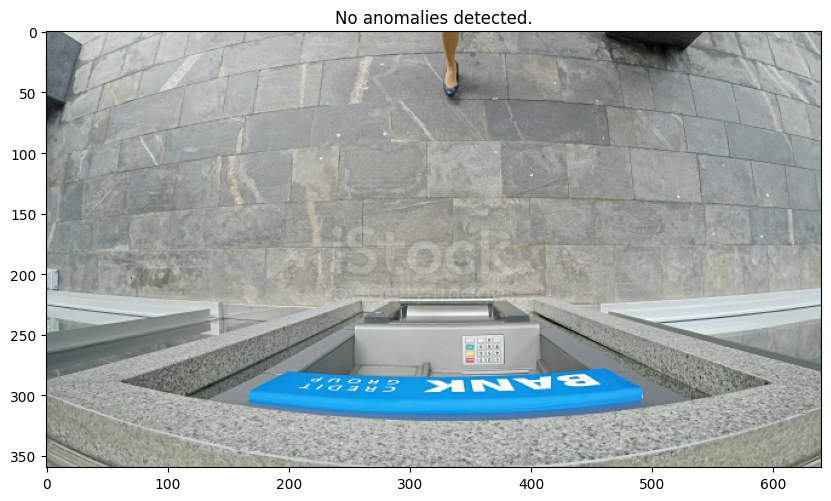

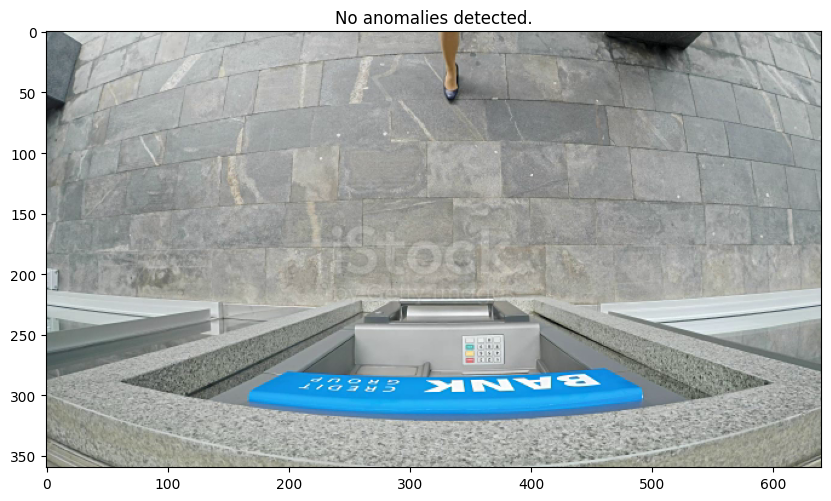

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from io import BytesIO
from PIL import Image

# Load your pre-trained anomaly detection model
# This needs to be loaded or defined here if you have a trained model.
def detect_anomalies(frame):
    return np.zeros_like(frame[:, :, 0])  # Dummy function for example purposes

# Dummy functions for cf, sf, mf, y
def get_cf(dataset, vindex, vindex_end):
    return np.random.rand(vindex_end - vindex)

def get_sf(dataset, vindex, vindex_end):
    return np.random.rand(vindex_end - vindex)

def get_mf(dataset, vindex, vindex_end):
    return np.random.rand(vindex_end - vindex)

def get_y(annotations, dataset, vindex, vindex_end):
    return np.random.rand(vindex_end - vindex)

dataset = '/content/drive/MyDrive/ATMA-V Dataset/videos'
videos = os.listdir(dataset)

# Create a VideoCapture object
cap = cv2.VideoCapture('/content/drive/MyDrive/ATMA-V Dataset/videos/11.mp4')

# Initialize background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Counter for naming image files
frame_count = 0

# Process the video
try:
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Apply background subtraction
        fgmask = fgbg.apply(frame)

        # Threshold the foreground mask
        _, thresh = cv2.threshold(fgmask, 240, 255, cv2.THRESH_BINARY)

        # Find contours of the thresholded image
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Draw bounding boxes around detected anomalies
        anomaly_detected = False
        for contour in contours:
            if cv2.contourArea(contour) > 500:  # Adjust this threshold as needed
                (x, y, w, h) = cv2.boundingRect(contour)
                cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
                anomaly_detected = True

        # Detect anomalies using your pre-trained model
        anomalies = detect_anomalies(frame)

        # Overlay detected anomalies on the frame
        frame[anomalies > 0] = [0, 0, 255]  # Mark anomalies with red color

        # Convert frame to RGB and display using matplotlib
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 10))
        plt.imshow(frame_rgb)
        plt.title("Anomaly detected!" if anomaly_detected else "No anomalies detected.")
        plt.show()

        frame_count += 1
        if frame_count > 20:  # Limit the number of frames processed for quick demo
            break
finally:
    cap.release()
